# The Chemical Gardener  
## Turing Patterns with a Reaction–Diffusion Model (Gray–Scott)

This notebook is a small “numerical laboratory” for watching order appear from almost nothing.

We simulate two abstract chemical species on a 2D surface: **U is a substrate** consumed by **V, an autocatalyst**. They **diffuse** across space and **react nonlinearly** at each point. The only thing we “design” is the model and its parameters, everything else is deliberately plain: we start from an almost uniform state, add a whisper of random noise to break symmetry, and let the dynamics take over.

The payoff is not just pretty images. It’s a concrete demonstration that when continuous dynamical systems are discretized and simulated correctly, they can generate rich structure with no explicit blueprint: spots, stripes, and labyrinths that *emerge* rather than being drawn.

From a data science perspective, the workflow is the point:
- generate **synthetic spatiotemporal data** from a well-defined mathematical model,
- implement fast **vectorized** numerical updates with NumPy (no per-cell loops),
- simulate one selected parameter regime,
- analyze and visualize what the model produces and why.

In [1]:
# 1) Imports + reproducibility
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML


# Reproducibility
rng = np.random.default_rng(7)

# Plot defaults
plt.rcParams.update({
    "figure.dpi": 120,
    "axes.titlesize": 12,
    "axes.labelsize": 11,
})

In [2]:
# 2) Simulation grid + time stepping
n = 200          # grid size: n x n
dx = 1.0         # spatial step (arbitrary units)
dt = 1.0         # time step (chosen for stability with this discretization)
steps = 10_000   # total iterations

# We'll start with periodic boundaries (wrap-around) for simplicity.
boundary = "periodic"

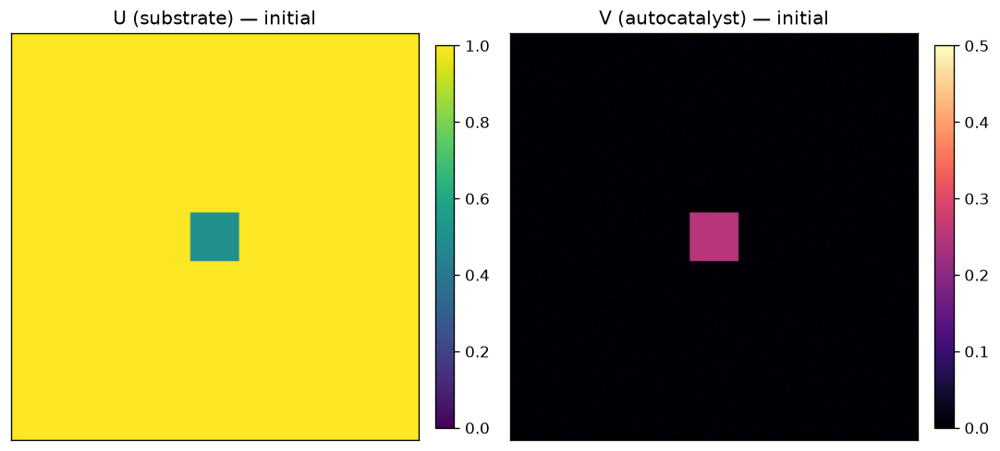

In [3]:
# 3) Initial conditions (U, V)
U = np.ones((n, n), dtype=np.float64)
V = np.zeros((n, n), dtype=np.float64)

# Small random perturbation to break symmetry
U += 0.01 * rng.random((n, n))
V += 0.01 * rng.random((n, n))

# A localized 'seed' region that triggers pattern growth
r = 12
cx = n // 2
cy = n // 2
U[cx - r : cx + r, cy - r : cy + r] = 0.50
V[cx - r : cx + r, cy - r : cy + r] = 0.25

# Quick visualization (avoid dumping full arrays)
fig, ax = plt.subplots(1, 2, figsize=(9, 4), constrained_layout=True)

im0 = ax[0].imshow(U, cmap="viridis", vmin=0.0, vmax=1.0)
ax[0].set_title("U (substrate) — initial")
ax[0].set_xticks([])
ax[0].set_yticks([])
fig.colorbar(im0, ax=ax[0], fraction=0.046, pad=0.04)

im1 = ax[1].imshow(V, cmap="magma", vmin=0.0, vmax=0.5)
ax[1].set_title("V (autocatalyst) — initial")
ax[1].set_xticks([])
ax[1].set_yticks([])
fig.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04)
None

### What these images show (and why they look "boring" at first)

Each panel is a **heatmap** of a concentration field on the 2D grid: every pixel corresponds to one grid cell $(i, j)$.

- **Left (U)**: the substrate concentration.
- **Right (V)**: the autocatalyst concentration.
- The **colorbar** maps color → numeric concentration value at that location.

At this stage we are only setting **initial conditions**:
1. A nearly uniform background (roughly $U \approx 1$, $V \approx 0$).
2. Tiny random noise to break symmetry (so the system has something to amplify).
3. A centered "seed" patch where we force $U$ lower and $V$ higher to kick-start pattern formation.

So the maps look simple (and slightly noisy) on purpose. The interesting structure only appears after we repeatedly apply:
- **diffusion** (spreading via the Laplacian), and
- **reaction** (local nonlinear interaction between \(U\) and \(V\)).

In the next step we’ll implement the **discrete Laplacian** (our diffusion operator) in a fully vectorized way.

### Diffusion as a discrete Laplacian (periodic boundary)

Diffusion is modeled with the Laplacian operator, $\nabla^2$, which measures how different a cell is from its neighbors.

On a 2D grid we approximate it with the **5-point stencil**:

$$
\nabla^2 A_{i,j} \approx \frac{
A_{i+1,j} + A_{i-1,j} + A_{i,j+1} + A_{i,j-1} - 4A_{i,j}
}{dx^2}
$$

Intuition:
- If a cell is **higher** than its neighbors, the Laplacian is typically **negative** → diffusion tends to pull it down.
- If a cell is **lower** than its neighbors, the Laplacian is typically **positive** → diffusion tends to push it up.

We’ll start with **periodic boundaries** (“wrap-around”): the grid behaves like a torus, so edges connect to the opposite side. This avoids edge artifacts while we build the model.

In [4]:
# Discrete Laplacian (5-point stencil), periodic boundaries
def laplacian_periodic(A: np.ndarray, dx: float) -> np.ndarray:
    return (
        np.roll(A, shift=+1, axis=0)
        + np.roll(A, shift=-1, axis=0)
        + np.roll(A, shift=+1, axis=1)
        + np.roll(A, shift=-1, axis=1)
        - 4.0 * A
    ) / (dx * dx)


lap_U = laplacian_periodic(U, dx=dx)
lap_V = laplacian_periodic(V, dx=dx)

None

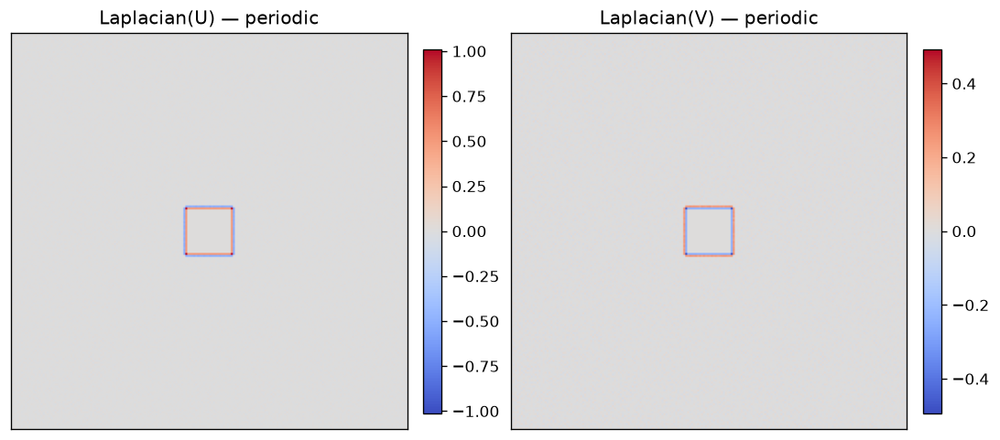

In [5]:
# Diagnostic: visualize the Laplacian fields (diffusion operator response)
fig, ax = plt.subplots(1, 2, figsize=(9, 4), constrained_layout=True)

# Symmetric color range around 0 makes sign (positive/negative) obvious
mU = float(np.max(np.abs(lap_U)))
mV = float(np.max(np.abs(lap_V)))

im0 = ax[0].imshow(lap_U, cmap="coolwarm", vmin=-mU, vmax=mU)
ax[0].set_title("Laplacian(U) — periodic")
ax[0].set_xticks([])
ax[0].set_yticks([])
fig.colorbar(im0, ax=ax[0], fraction=0.046, pad=0.04)

im1 = ax[1].imshow(lap_V, cmap="coolwarm", vmin=-mV, vmax=mV)
ax[1].set_title("Laplacian(V) — periodic")
ax[1].set_xticks([])
ax[1].set_yticks([])
fig.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04)

None

### Reaction step: the Gray–Scott model

Diffusion alone only smooths fields out. Patterns appear when diffusion is coupled with a **local nonlinear reaction**.

In the Gray–Scott model we evolve two fields, $U$ and $V$:

- $U$ is continuously **fed** into the system (feed rate $F$).
- $V$ is continuously **removed** (kill rate $k$).
- The key nonlinear reaction term is $U V^2$.

A common form is:

$$
\frac{\partial U}{\partial t} = D_U \nabla^2 U\;-\;UV^2\;+\;F(1-U)
$$

$$
\frac{\partial V}{\partial t} = D_V \nabla^2 V\;+\;UV^2\;-\;(F+k)V
$$

Next we’ll discretize time with an explicit Euler step and update the whole grid with vectorized NumPy operations.

In [6]:
# Gray–Scott parameters (a solid starting point)
Du = 0.16   # diffusion rate of U
Dv = 0.08   # diffusion rate of V
F = 0.060   # feed rate
k = 0.062   # kill rate

params = {"Du": Du, "Dv": Dv, "F": F, "k": k, "dx": dx, "dt": dt}
params

None

In [7]:
# One Gray–Scott update step (explicit Euler), periodic boundary Laplacian
def step_gray_scott(
    U: np.ndarray,
    V: np.ndarray,
    *,
    Du: float,
    Dv: float,
    F: float,
    k: float,
    dx: float,
    dt: float,
) -> tuple[np.ndarray, np.ndarray]:
    # Diffusion
    lap_U = laplacian_periodic(U, dx=dx)
    lap_V = laplacian_periodic(V, dx=dx)

    # Reaction
    UVV = U * V * V
    dU = Du * lap_U - UVV + F * (1.0 - U)
    dV = Dv * lap_V + UVV - (F + k) * V

    # Euler update
    U_next = U + dt * dU
    V_next = V + dt * dV

    # Reject instability rather than conceal it with concentration clipping.
    if not (np.isfinite(U_next).all() and np.isfinite(V_next).all()):
        raise FloatingPointError("Non-finite concentrations; reduce dt.")
    if min(U_next.min(), V_next.min()) < -1e-12:
        raise ValueError("Negative concentrations; reduce dt for this parameter set.")
    return np.maximum(U_next, 0.0), np.maximum(V_next, 0.0)


None

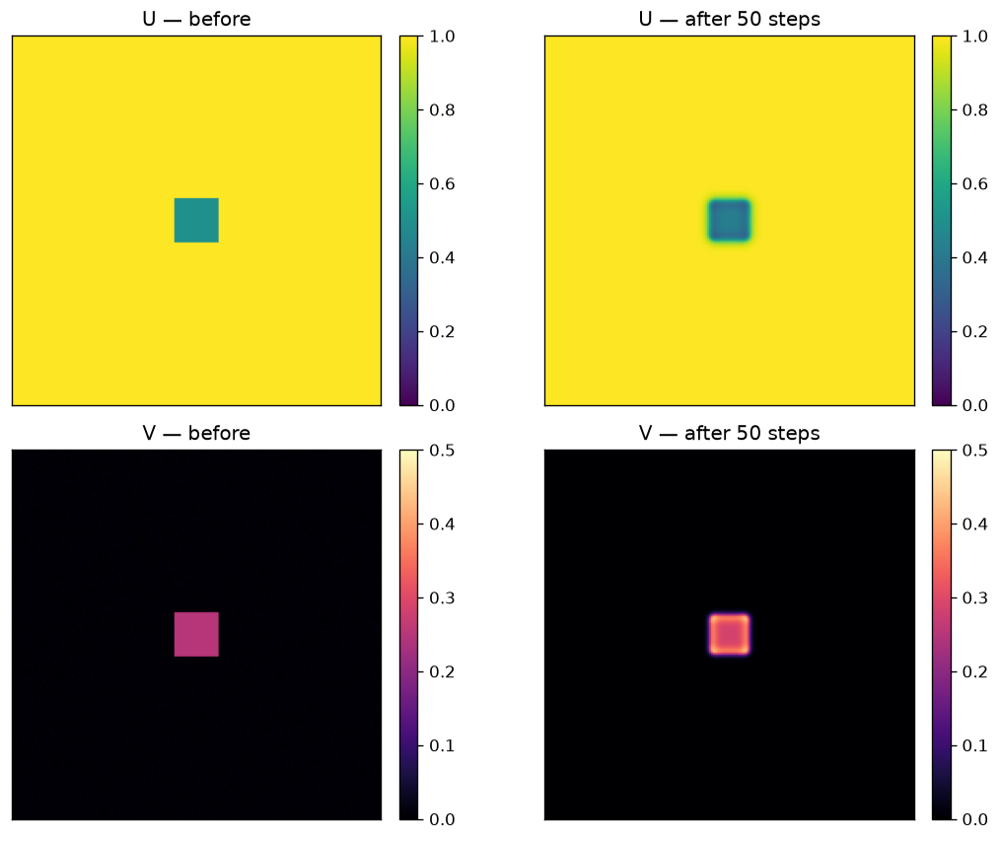

In [8]:
U0 = U.copy()
V0 = V.copy()

n_steps_test = 50
for _ in range(n_steps_test):
    U, V = step_gray_scott(U, V, Du=Du, Dv=Dv, F=F, k=k, dx=dx, dt=dt)

fig, ax = plt.subplots(2, 2, figsize=(9, 7), constrained_layout=True)

im00 = ax[0, 0].imshow(U0, cmap="viridis", vmin=0.0, vmax=1.0)
ax[0, 0].set_title("U — before")
ax[0, 0].set_xticks([]); ax[0, 0].set_yticks([])
fig.colorbar(im00, ax=ax[0, 0], fraction=0.046, pad=0.04)

im01 = ax[0, 1].imshow(U, cmap="viridis", vmin=0.0, vmax=1.0)
ax[0, 1].set_title(f"U — after {n_steps_test} steps")
ax[0, 1].set_xticks([]); ax[0, 1].set_yticks([])
fig.colorbar(im01, ax=ax[0, 1], fraction=0.046, pad=0.04)

im10 = ax[1, 0].imshow(V0, cmap="magma", vmin=0.0, vmax=0.5)
ax[1, 0].set_title("V — before")
ax[1, 0].set_xticks([]); ax[1, 0].set_yticks([])
fig.colorbar(im10, ax=ax[1, 0], fraction=0.046, pad=0.04)

im11 = ax[1, 1].imshow(V, cmap="magma", vmin=0.0, vmax=0.5)
ax[1, 1].set_title(f"V — after {n_steps_test} steps")
ax[1, 1].set_xticks([]); ax[1, 1].set_yticks([])
fig.colorbar(im11, ax=ax[1, 1], fraction=0.046, pad=0.04)

None

### What we just did

At this point the model is fully defined:

- We created initial concentration fields **U** (substrate) and **V** (autocatalyst), with small random noise and a central “seed”.
- We implemented **diffusion** via the discrete Laplacian (5‑point stencil with periodic boundaries).
- We implemented the **Gray–Scott reaction–diffusion update** and ran a short test of `n_steps_test` iterations.
- We visualized **before vs after** for both fields.

### How to read the “before/after” plots
Each image is a spatial map: one value per grid cell.

- **U panels (top row)** show the substrate concentration.
- **V panels (bottom row)** show the autocatalyst concentration.
- The “after” panels show the result of repeatedly applying **diffusion + reaction**.

### Why we do not see a clear pattern yet
With only ~50 steps, the system has usually not had enough time to develop large‑scale structure. Early on, diffusion mainly smooths, and the nonlinear reaction starts to amplify differences slowly.

In the next section we’ll run the simulation for **many more steps** (thousands), saving snapshots at regular intervals so we can clearly see **spots/stripes/labyrinths** emerge over time.

In [9]:
# Run long simulation and save snapshots
save_every = 500                    # snapshot interval
n_snaps = steps // save_every + 1   # include step 0

U_run = U0.copy()
V_run = V0.copy()  # t=0 is the original state, before the 50-step diagnostic.

U_snaps = []
V_snaps = []
t_snaps = []

# Save initial state
U_snaps.append(U_run.copy())
V_snaps.append(V_run.copy())
t_snaps.append(0)

for t in range(1, steps + 1):
    U_run, V_run = step_gray_scott(U_run, V_run, Du=Du, Dv=Dv, F=F, k=k, dx=dx, dt=dt)

    if t % save_every == 0:
        U_snaps.append(U_run.copy())
        V_snaps.append(V_run.copy())
        t_snaps.append(t)

### Animation: a “video” of pattern formation

We’ll animate the saved snapshots. This avoids re-running the simulation and makes it easy to change playback speed or colormaps.


In [10]:
def animate_uv(
    U_snaps: list[np.ndarray],
    V_snaps: list[np.ndarray],
    times: list[int],
    *,
    interval_ms: int = 80,
    u_cmap: str = "viridis",
    v_cmap: str = "magma",
    u_vmin: float | None = 0.0,
    u_vmax: float | None = 1.0,
    v_vmin: float | None = 0.0,
    v_vmax: float | None = 0.5,
):
    fig, ax = plt.subplots(1, 2, figsize=(10, 4.5), constrained_layout=True)

    im_u = ax[0].imshow(U_snaps[0], cmap=u_cmap, vmin=u_vmin, vmax=u_vmax, animated=True)
    ax[0].set_title(f"U — t = {times[0]}")
    ax[0].set_xticks([]); ax[0].set_yticks([])
    fig.colorbar(im_u, ax=ax[0], fraction=0.046, pad=0.04)

    im_v = ax[1].imshow(V_snaps[0], cmap=v_cmap, vmin=v_vmin, vmax=v_vmax, animated=True)
    ax[1].set_title(f"V — t = {times[0]}")
    ax[1].set_xticks([]); ax[1].set_yticks([])
    fig.colorbar(im_v, ax=ax[1], fraction=0.046, pad=0.04)

    def update(i: int):
        im_u.set_array(U_snaps[i])
        im_v.set_array(V_snaps[i])
        ax[0].set_title(f"U — t = {times[i]}")
        ax[1].set_title(f"V — t = {times[i]}")
        return (im_u, im_v)

    ani = animation.FuncAnimation(
        fig,
        update,
        frames=len(times),
        interval=interval_ms,
        blit=False,
        repeat=True,
    )
    plt.close(fig)
    return ani

ani_uv = animate_uv(U_snaps, V_snaps, t_snaps, interval_ms=80)
HTML(ani_uv.to_jshtml())

### Results & wrap‑up (what we did, what we observed, what it means)

This notebook implemented and simulated the **Gray–Scott reaction–diffusion system** on a 2D grid using fully vectorized NumPy operations.

#### 1) What we built
We modeled two abstract chemical species on a square lattice:

- **U (substrate)** and **V (autocatalyst)** stored as 2D arrays.
- **Diffusion** implemented with a 5‑point **discrete Laplacian** and **periodic boundary conditions** (wrap-around).
- **Reaction** implemented via the Gray–Scott kinetics, with:
  - feed of $U$ controlled by $F$,
  - removal of $V$ controlled by $k$,
  - a nonlinear coupling term $UV^2$.

The update rule (explicit Euler) is:

$$
\frac{\partial U}{\partial t} = D_U \nabla^2 U - UV^2 + F(1-U),
\qquad
\frac{\partial V}{\partial t} = D_V \nabla^2 V + UV^2 - (F+k)V.
$$

#### 2) Why we start “boring”
We intentionally started near a homogeneous state:

- $U \approx 1$, $V \approx 0$,
- plus *tiny noise* and a small **seed patch** (low $U$, high $V$).

This is important: without symmetry breaking, the dynamics would remain uniform and nothing interesting would appear.

#### 3) What the animation shows (the main trend)
Across saved snapshots, a clear qualitative progression typically appears:

1. **Early phase (seed spreads):** diffusion smooths the sharp seed boundary, and the reaction term begins amplifying local differences.
2. **Pattern formation phase (structure emerges):** local autocatalysis (through $UV^2$) competes with diffusion, creating repeated spatial motifs.
3. **Late phase (stabilization):** the field may evolve more slowly. This notebook does not test convergence to an equilibrium.

In other words, the overall trend is:

$$
\text{near-uniform} \;\rightarrow\; \text{growing contrast} \;\rightarrow\; \text{organized spatial patterns} \;\rightarrow\; \text{stabilization}.
$$

#### 4) Why this produces Turing-like patterns
Patterns are not drawn in; they arise from:

- **local nonlinear feedback** (reaction creates and reinforces differences), and
- **spatial coupling** (diffusion spreads and smooths those differences).

For certain parameter regimes $(D_U, D_V, F, k)$, that competition selects a characteristic **spatial wavelength**, yielding spots/stripes/labyrinths.

#### 5) Notes on implementation choices
- The Laplacian and updates are **vectorized** (fast, no per-cell Python loops).
- We used **periodic boundaries** to avoid edge artifacts while exploring the dynamics.
- We saved **snapshots** rather than every frame to keep memory manageable and to allow playback without re-simulating.